In [9]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go

dataset1 = pd.read_csv("covid.csv")
dataset1.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [ ]:
#Importing Dataset2
dataset2 = pd.read_csv("covid_grouped.csv")
dataset2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [ ]:
#Cleaning dataframe
dataset1.drop(['NewCases', 'NewDeaths', 'NewRecovered'], 
              axis=1, inplace=True)


In [ ]:
#Importing create_table from  Figure Factory

from plotly.figure_factory import create_table

colorscale = [[0, '#4d004c'], [.5, '#f2e5ff'], [1, '#ffffff']]
table = create_table(dataset1.head(15), colorscale=colorscale)
py.iplot(table)

In [ ]:
#Bar graphs- Comparisons between COVID infected countries in terms of total cases
px.bar(dataset1.head(15), x = 'Country/Region', 
       y = 'TotalCases',color = 'TotalCases', 
       height = 500,hover_data = ['Country/Region', 'Continent'])


In [ ]:
#Bar graphs- Comparisons between COVID infected countries in terms of total deaths

px.bar(dataset1.head(15), x = 'Country/Region', y = 'TotalCases',
       color = 'TotalDeaths', height = 500,
       hover_data = ['Country/Region', 'Continent'])

In [ ]:
#Bar graphs- Comparisons between COVID infected countries in terms of total recovered
px.bar(dataset1.head(15), x= 'Country/Region', 
       y= 'TotalCases', color= 'TotalRecovered', height= 500,
       hover_data= ['Country/Region', 'Continent'])

In [ ]:
#Bar graphs- Comparisons between COVID infected countries in terms of total tests
px.bar(dataset1.head(15), x = 'TotalTests', y = 'Country/Region',
       color = 'TotalTests',orientation ='h',  height = 500,
       hover_data = ['Country/Region', 'Continent'])

In [ ]:
#Data Visualization through Bubble Charts-Continent Wise
px.scatter(dataset1, x='Continent',y='TotalCases', 
           hover_data=['Country/Region', 'Continent'], 
           color='TotalCases', size='TotalCases', size_max=80)

In [ ]:
#Data Visualization through Bubble Charts-Country Wise
fig=px.scatter(dataset1.head(100), x='Country/Region', y='TotalCases', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalCases', size='TotalCases', size_max=80)
fig.update_layout(xaxis_tickangle=-90)
fig.show()

In [ ]:
#Country/Region VS Tests/1M pop (color-scale of Tests/1M pop)
px.scatter(dataset1.head(30), x='Country/Region', y= 'Tests/1M pop', 
           hover_data=['Country/Region', 'Continent'],
           color='Tests/1M pop', size= 'Tests/1M pop', size_max=80)

In [ ]:
#Advanced Data Visualization- Bar graphs for All top infected Countries
px.bar(dataset2, x="Date", y="Confirmed", color="Confirmed", 
       hover_data=["Confirmed", "Date", "Country/Region"], height=400)

In [ ]:
#Countries Specific COVID Data Visualization: (United States)

df_US= dataset2.loc[dataset2["Country/Region"]=="US"]
px.bar(df_US, x="Date", y="Confirmed", color="Confirmed", height=400)

In [ ]:
#Visualization of Data in terms of Maps

px.choropleth(dataset2,
              locations="iso_alpha",
              color="Confirmed",
              hover_name="Country/Region", 
              color_continuous_scale="Blues",
              animation_frame="Date")

In [33]:
px.choropleth(dataset2,
              locations='iso_alpha',
              color="Deaths",
              hover_name="Country/Region",
              color_continuous_scale="Viridis",
              animation_frame="Date" )

In [ ]:
#Bar Graph animation 
px.bar(dataset2, x="WHO Region", y="Confirmed", color="WHO Region", 
       animation_frame="Date", hover_name="Country/Region")

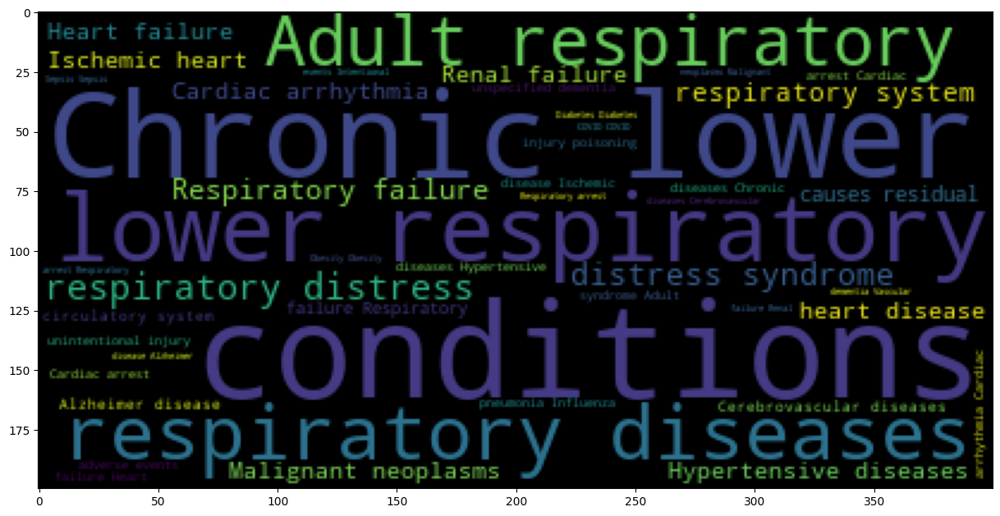

In [ ]:

#Visualizing text using Word Cloud
dataset3= pd.read_csv("coviddeath.csv")
dataset3.head()
dataset3.groupby(["Condition"]).count()

from wordcloud import WordCloud

sentences = dataset3["Condition"].tolist()
sentences_as_a_string = ' '.join(sentences)

plt.figure(figsize=(15,15))
plt.imshow(WordCloud().generate(sentences_as_a_string))